In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator

IMAGE_DIR="archive-2/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)"

In [2]:
import os
train_dir = IMAGE_DIR+"/train2"
valid_dir = IMAGE_DIR+"/valid2"


In [3]:
diseases = os.listdir(train_dir)

In [4]:
print(diseases)

['.DS_Store', 'Apple___Cedar_apple_rust', 'Apple___Apple_scab', 'Apple___Black_rot', 'Apple___healthy']


In [5]:
print("Total disease classes are: {}".format(len(diseases)))

Total disease classes are: 5


In [6]:

img_size = (224, 224)
batch_size = 32

datagen = ImageDataGenerator(rescale=1.0/255.0,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')

train_gen = datagen.flow_from_directory(
    f"{train_dir}", 
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

val_gen = datagen.flow_from_directory(
      f"{valid_dir}", 
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

test_gen = datagen.flow_from_directory(
    f"{IMAGE_DIR}/test2", 
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical', 
    shuffle=False
)


Found 2620 images belonging to 4 classes.
Found 1040 images belonging to 4 classes.
Found 7 images belonging to 1 classes.


In [22]:
# Weighted Loss Function
def get_weighted_loss(pos_weights, neg_weights, epsilon=1e-7):
    def weighted_loss(y_true, y_pred):
        weights = y_true * pos_weights + (1 - y_true) * neg_weights
        loss = -weights * (
            y_true * tf.math.log(y_pred + epsilon) +
            (1 - y_true) * tf.math.log(1 - y_pred + epsilon)
        )
        return tf.reduce_mean(loss)
    return weighted_loss




In [ ]:

base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
x = base_model.output
x = GlobalAveragePooling2D()(x)

predictions = Dense(4, activation="sigmoid")(x)  


pos_weights = [1.0, 1.0, 1.0, 1.0]  
neg_weights = [1.0, 1.0, 1.0, 1.0]  


model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=1e-4), 
              loss=get_weighted_loss(pos_weights, neg_weights), 
              metrics=['accuracy'])


checkpoint = ModelCheckpoint("best_model.keras", save_best_only=True, monitor="val_loss", mode="min")
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.2, patience=5, min_lr=1e-6)
early_stopping = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True)


history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=10,  
    callbacks=[checkpoint, reduce_lr, early_stopping]
)

/Users/vinaypatel/Documents/anoconda/anaconda3/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 557s 7s/step - accuracy: 0.7956 - loss: 0.3812 - val_accuracy: 0.5125 - val_loss: 0.6769 - learning_rate: 1.0000e-04
Epoch 2/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 568s 7s/step - accuracy: 0.9984 - loss: 0.0249 - val_accuracy: 0.7135 - val_loss: 0.4335 - learning_rate: 1.0000e-04
Epoch 3/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 585s 7s/step - accuracy: 0.9958 - loss: 0.0145 - val_accuracy: 0.9346 - val_loss: 0.1127 - learning_rate: 1.0000e-04
Epoch 4/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 589s 7s/step - accuracy: 0.9982 - loss: 0.0095 - val_accuracy: 0.9769 - val_loss: 0.0371 - learning_rate: 1.0000e-04
Epoch 5/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 552s 7s/step - accuracy: 0.9984 - loss: 0.0122 - val_accuracy: 0.9952 - val_loss: 0.0096 - learning_rate: 1.0000e-04
Epoch 6/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 563s 7s/step - accuracy: 0.9999 - loss: 0.0043 - val_accuracy: 0.9923 - val_loss: 0.0144 - learning_rate: 1.0000e-04
Epoch 7/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 562s 7s/step - accuracy: 0.9976 

In [ ]:

model.load_weights("best_model.keras")
loss, accuracy = model.evaluate(test_gen)
print(f"Test Accuracy: {accuracy * 100:.2f}%")



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step - accuracy: 0.4286 - loss: 5.7596
Test Accuracy: 42.86%


In [ ]:

model.load_weights("best_model.keras")
loss, accuracy = model.evaluate(train_gen)
print(f"Train Accuracy: {accuracy * 100:.2f}%")



82/82 ━━━━━━━━━━━━━━━━━━━━ 98s 1s/step - accuracy: 1.0000 - loss: 0.0016
Train Accuracy: 100.00%


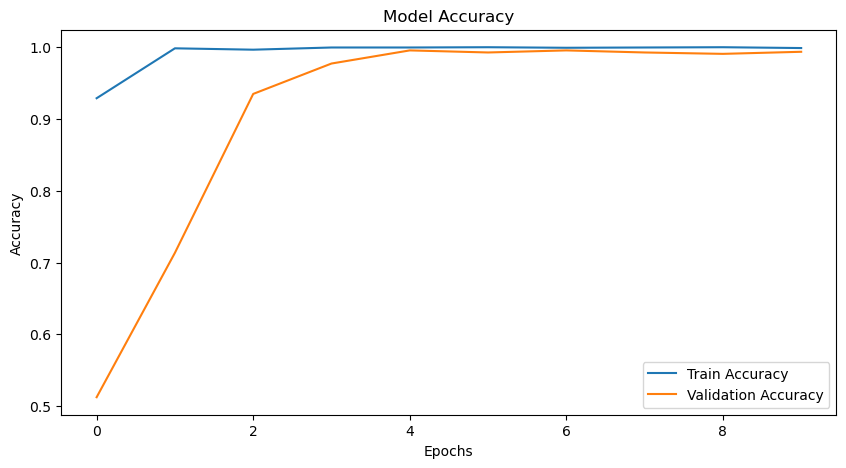

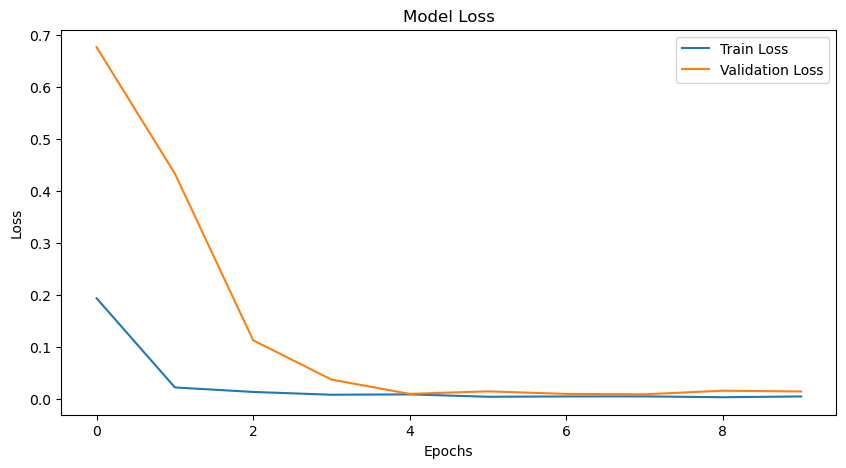

In [ ]:

plt.figure(figsize=(10, 5))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
import cv2
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt

def compute_gradcam(model, img_path, image_dir, labels, labels_to_show):
    # Ensure valid labels
    labels = [label for label in labels if label != '.DS_Store']
    labels_to_show = [label for label in labels_to_show if label in labels]
    
    img_full_path = os.path.join(image_dir, img_path)
    img = tf.keras.preprocessing.image.load_img(img_full_path, target_size=(224, 224))
    img_array = tf.keras.preprocessing.image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    preds = model.predict(img_array)
    print(f"Predictions for {img_path}:")
    for i, label in enumerate(labels):
        if i < len(preds[0]):  
            print(f"{label}: {preds[0][i]:.4f}")

    grad_model = Model(
        inputs=model.input,
        outputs=[model.get_layer('conv5_block16_concat').output, model.output]
    )
    for label in labels_to_show:
        label_index = labels.index(label)
        with tf.GradientTape() as tape:
            conv_outputs, predictions = grad_model(img_array)
            loss = predictions[:, label_index]
        grads = tape.gradient(loss, conv_outputs)
        pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
        conv_outputs = conv_outputs[0]
        heatmap = np.maximum(np.dot(conv_outputs, pooled_grads.numpy()), 0)
        heatmap /= np.max(heatmap) if np.max(heatmap) else 1
        original_img = cv2.imread(img_full_path)
        heatmap_resized = cv2.resize(heatmap, (original_img.shape[1], original_img.shape[0]))
        heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)
        overlay = cv2.addWeighted(original_img, 0.6, heatmap_colored, 0.4, 0)

        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.title("Original Image")
        plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.subplot(1, 2, 2)
        plt.title(f"Grad-CAM for {label}")
        plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Predictions for AppleCedarRust3.JPG:
Apple___Cedar_apple_rust: 0.0019
Apple___Apple_scab: 0.0145
Apple___Black_rot: 0.9804
Apple___healthy: 0.0023


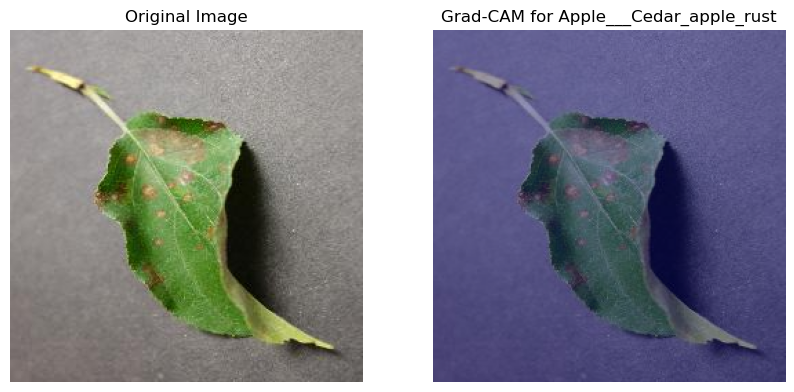

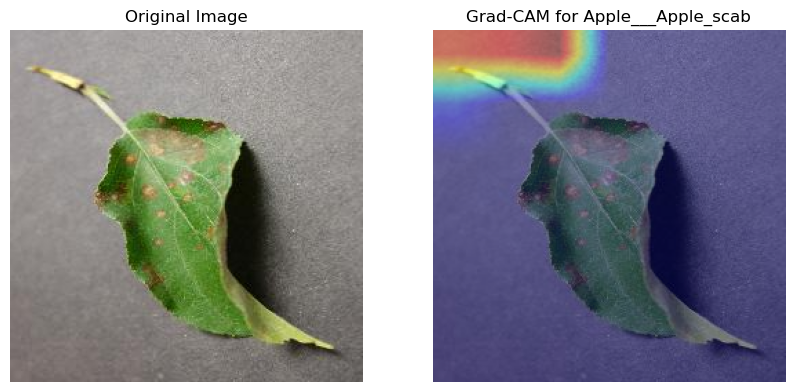

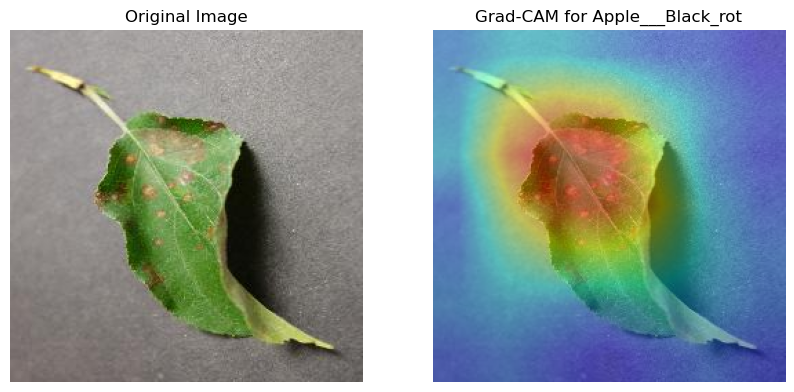

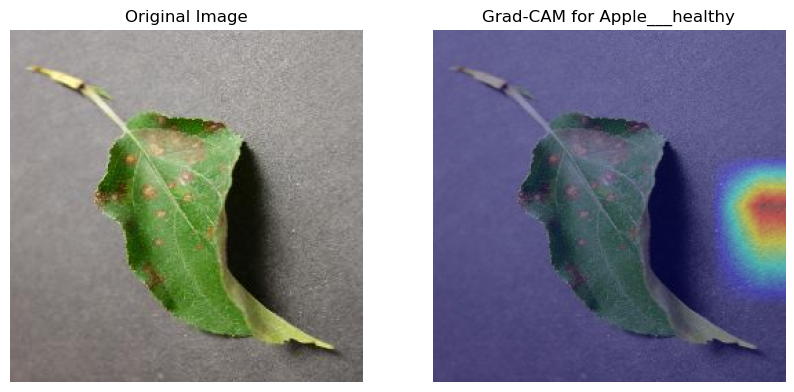

In [14]:
labels = [ 'Apple___Cedar_apple_rust', 'Apple___Apple_scab', 'Apple___Black_rot', 'Apple___healthy']

compute_gradcam(
    model=model,
    img_path='AppleCedarRust3.JPG',
    image_dir='/Users/vinaypatel/Documents/plant/archive-2/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/test2/test',
    labels=labels,
    labels_to_show = [ 'Apple___Cedar_apple_rust', 'Apple___Apple_scab', 'Apple___Black_rot', 'Apple___healthy']

)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Predictions for AppleScab3.JPG:
Apple___Cedar_apple_rust: 0.9976
Apple___Apple_scab: 0.0001
Apple___Black_rot: 0.0006
Apple___healthy: 0.0007


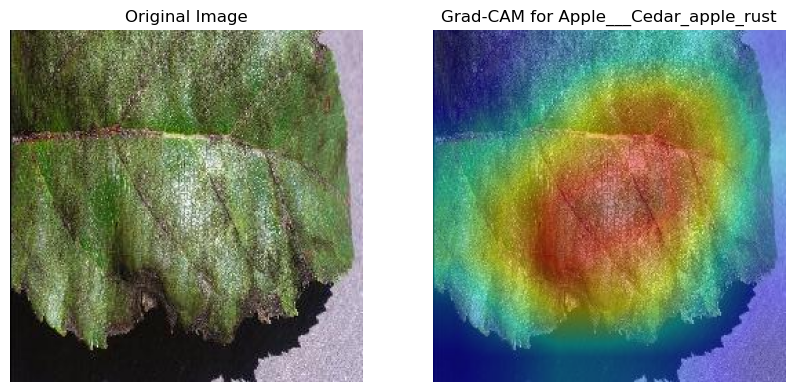

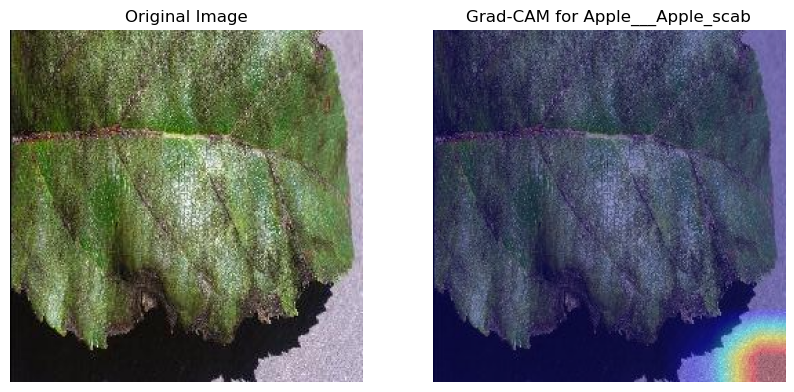

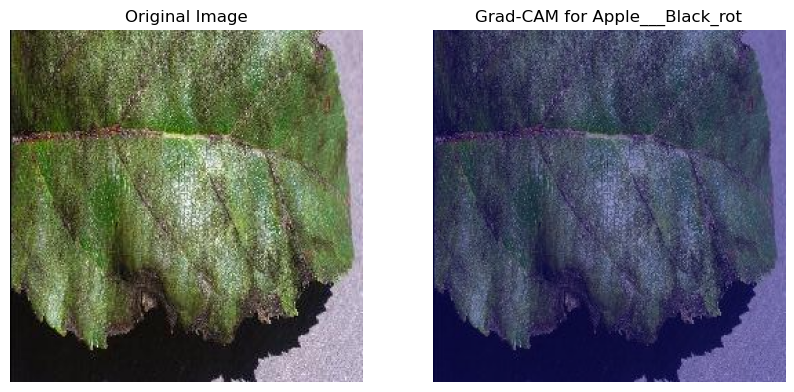

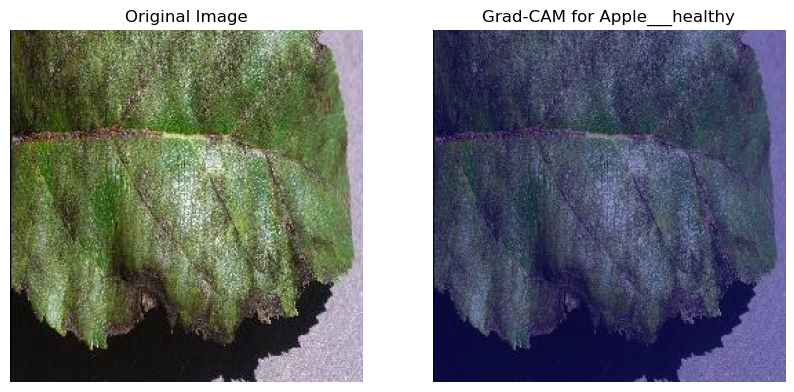

In [15]:
labels = [ 'Apple___Cedar_apple_rust', 'Apple___Apple_scab', 'Apple___Black_rot', 'Apple___healthy']

compute_gradcam(
    model=model,
    img_path='AppleScab3.JPG',
    image_dir='/Users/vinaypatel/Documents/plant/archive-2/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/test2/test',
    labels=labels,
    labels_to_show = [ 'Apple___Cedar_apple_rust', 'Apple___Apple_scab', 'Apple___Black_rot', 'Apple___healthy']

)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Predictions for AppleCedarRust1.JPG:
Apple___Cedar_apple_rust: 0.0026
Apple___Apple_scab: 0.0057
Apple___Black_rot: 0.9949
Apple___healthy: 0.0019


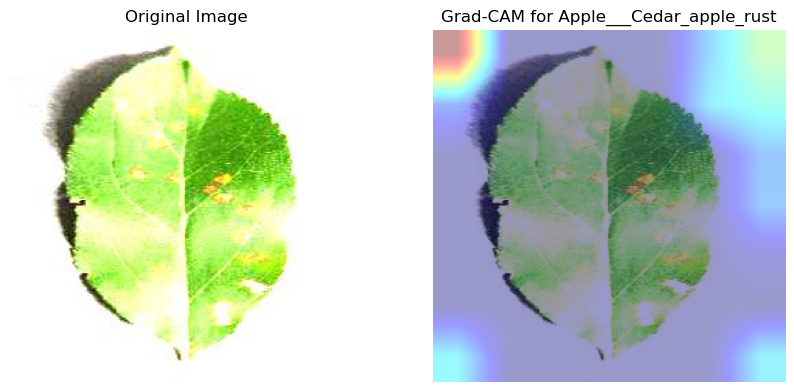

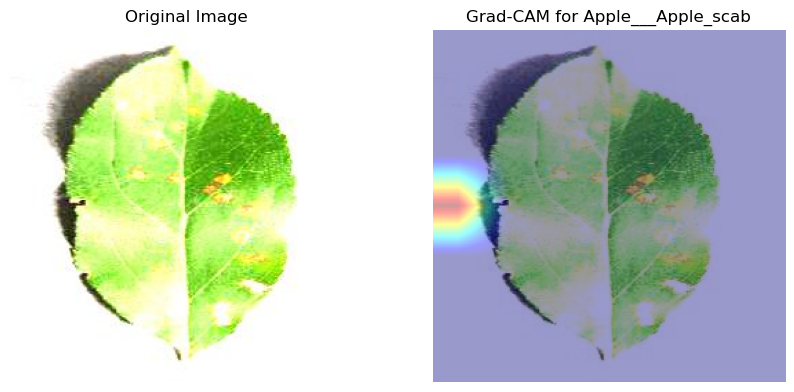

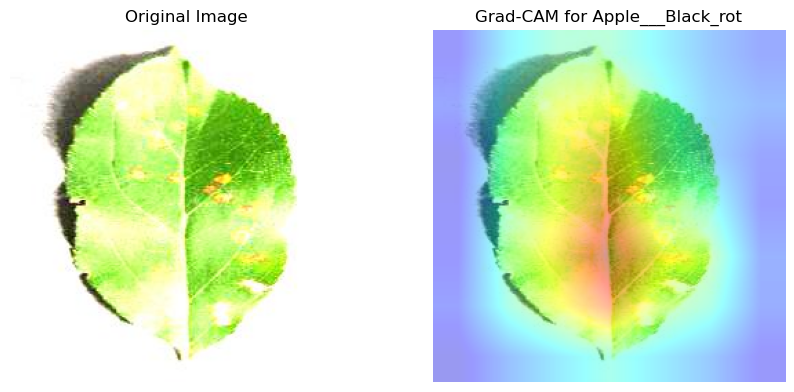

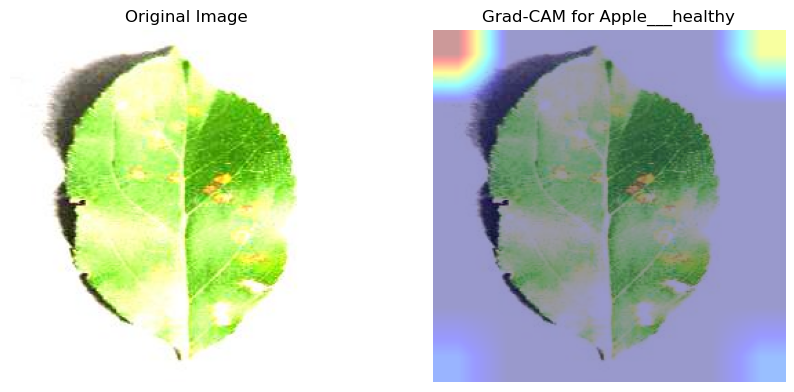

In [16]:
labels = [ 'Apple___Cedar_apple_rust', 'Apple___Apple_scab', 'Apple___Black_rot', 'Apple___healthy']

compute_gradcam(
    model=model,
    img_path='AppleCedarRust1.JPG',
    image_dir='/Users/vinaypatel/Documents/plant/archive-2/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/test2/test',
    labels=labels,
    labels_to_show = [ 'Apple___Cedar_apple_rust', 'Apple___Apple_scab', 'Apple___Black_rot', 'Apple___healthy']

)


**mobile net model**

In [ ]:
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping

base_model = MobileNet(weights='imagenet', include_top=False, input_shape=(224, 224, 3))


x = base_model.output
x = GlobalAveragePooling2D()(x)  
predictions = Dense(4, activation="sigmoid")(x)  


pos_weights = [1.0, 1.0, 1.0, 1.0]  
neg_weights = [1.0, 1.0, 1.0, 1.0]  


model = Model(inputs=base_model.input, outputs=predictions)


model.compile(
    optimizer=Adam(learning_rate=1e-4), 
    loss=get_weighted_loss(pos_weights, neg_weights),  
    metrics=['accuracy']
)


checkpoint = ModelCheckpoint("best_model_mobilenet.keras", save_best_only=True, monitor="val_loss", mode="min")
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.2, patience=5, min_lr=1e-6)
early_stopping = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True)

history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=10,  
    callbacks=[checkpoint, reduce_lr, early_stopping]
)


17225924/17225924 ━━━━━━━━━━━━━━━━━━━━ 9s 0us/step


/Users/vinaypatel/Documents/anoconda/anaconda3/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 133s 2s/step - accuracy: 0.7398 - loss: 0.3371 - val_accuracy: 0.3750 - val_loss: 1.4432 - learning_rate: 1.0000e-04
Epoch 2/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 128s 2s/step - accuracy: 0.9927 - loss: 0.0344 - val_accuracy: 0.7038 - val_loss: 0.6955 - learning_rate: 1.0000e-04
Epoch 3/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 126s 2s/step - accuracy: 0.9967 - loss: 0.0144 - val_accuracy: 0.9606 - val_loss: 0.1354 - learning_rate: 1.0000e-04
Epoch 4/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 124s 2s/step - accuracy: 0.9975 - loss: 0.0094 - val_accuracy: 0.9846 - val_loss: 0.0526 - learning_rate: 1.0000e-04
Epoch 5/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 125s 2s/step - accuracy: 0.9994 - loss: 0.0057 - val_accuracy: 0.9894 - val_loss: 0.0283 - learning_rate: 1.0000e-04
Epoch 6/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 124s 2s/step - accuracy: 0.9986 - loss: 0.0075 - val_accuracy: 0.9837 - val_loss: 0.0296 - learning_rate: 1.0000e-04
Epoch 7/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 125s 2s/step - accuracy: 1.0000 

In [ ]:

model.load_weights("best_model_mobilenet.keras")
loss, accuracy = model.evaluate(test_gen)
print(f"Test Accuracy: {accuracy * 100:.2f}%")



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step - accuracy: 0.4286 - loss: 6.4380
Test Accuracy: 42.86%


In [ ]:

model.load_weights("best_model_mobilenet.keras")
loss, accuracy = model.evaluate(train_gen)
print(f"Train Accuracy: {accuracy * 100:.2f}%")



82/82 ━━━━━━━━━━━━━━━━━━━━ 21s 260ms/step - accuracy: 0.9997 - loss: 0.0020
Train Accuracy: 99.96%


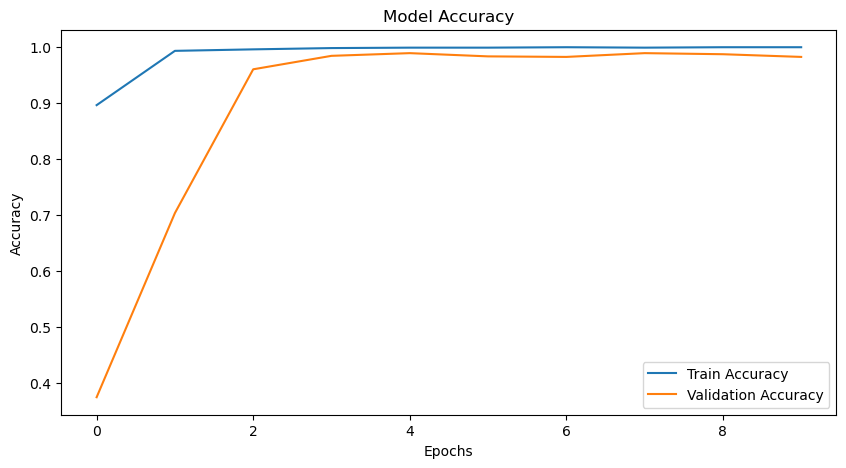

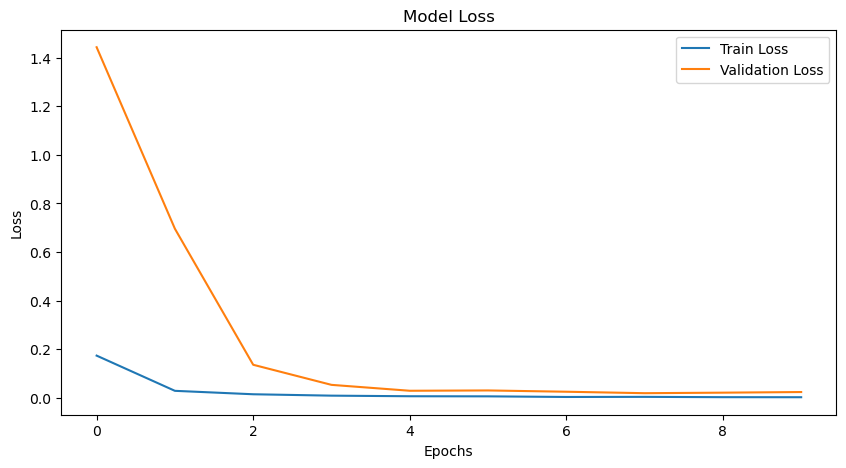

In [ ]:

plt.figure(figsize=(10, 5))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
def compute_gradcam(model, img_path, image_dir, labels, labels_to_show):
    
    labels = [label for label in labels if label != '.DS_Store']
    labels_to_show = [label for label in labels_to_show if label in labels]

   
    img_full_path = os.path.join(image_dir, img_path)
    img = tf.keras.preprocessing.image.load_img(img_full_path, target_size=(224, 224))
    img_array = tf.keras.preprocessing.image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    
    preds = model.predict(img_array)
    print(f"Predictions for {img_path}:")
    for i, label in enumerate(labels):
        if i < preds.shape[1]:  
            print(f"{label}: {preds[0][i]:.4f}")
        else:
            print(f"{label}: No prediction available (index out of bounds).")

    conv_layer_name = 'conv_pw_13_relu'  
    grad_model = Model(
        inputs=model.input,
        outputs=[model.get_layer(conv_layer_name).output, model.output]
    )

    
    for label in labels_to_show:
        label_index = labels.index(label)
        with tf.GradientTape() as tape:
            conv_outputs, predictions = grad_model(img_array)
            loss = predictions[:, label_index]

        grads = tape.gradient(loss, conv_outputs)
        pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
        conv_outputs = conv_outputs[0]

        
        heatmap = np.maximum(np.dot(conv_outputs, pooled_grads.numpy()), 0)
        heatmap /= np.max(heatmap) if np.max(heatmap) else 1

        original_img = cv2.imread(img_full_path)
        heatmap_resized = cv2.resize(heatmap, (original_img.shape[1], original_img.shape[0]))
        heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)
        overlay = cv2.addWeighted(original_img, 0.6, heatmap_colored, 0.4, 0)


        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.title("Original Image")
        plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.title(f"Grad-CAM for {label}")
        plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
        plt.axis('off')

        plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Predictions for AppleCedarRust3.JPG:
Apple___Cedar_apple_rust: 0.0022
Apple___Apple_scab: 0.0010
Apple___Black_rot: 0.9998
Apple___healthy: 0.0016


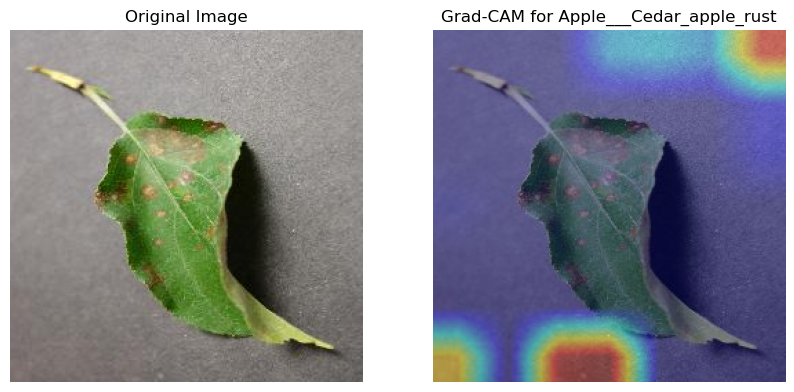

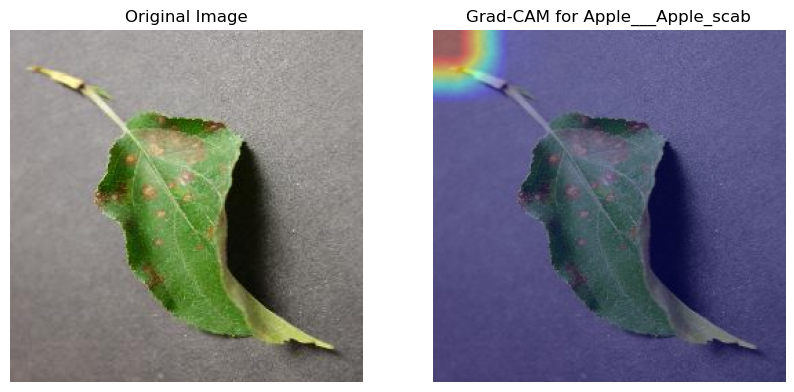

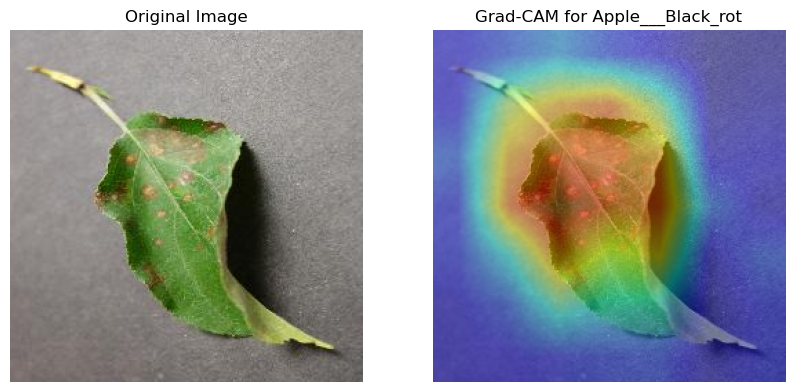

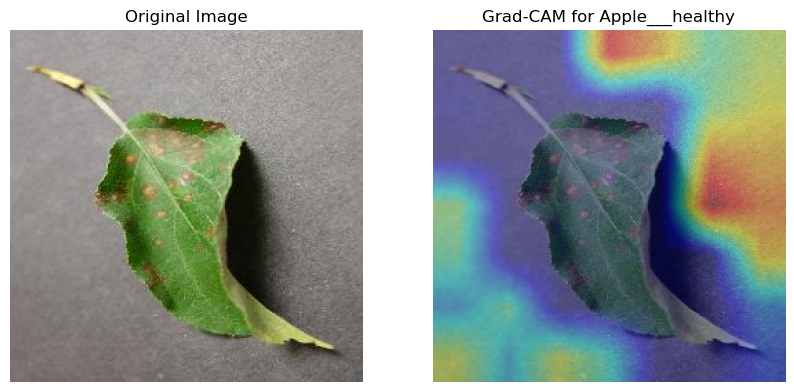

In [20]:
labels = [ 'Apple___Cedar_apple_rust', 'Apple___Apple_scab', 'Apple___Black_rot', 'Apple___healthy']

compute_gradcam(
    model=model,
    img_path='AppleCedarRust3.JPG',
    image_dir='/Users/vinaypatel/Documents/plant/archive-2/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/test2/test',
    labels=labels,
    labels_to_show = [ 'Apple___Cedar_apple_rust', 'Apple___Apple_scab', 'Apple___Black_rot', 'Apple___healthy']

)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Predictions for 0a41c25a-f9a6-4c34-8e5c-7f89a6ac4c40___FREC_C.Rust 9807_270deg.JPG:
Apple___Cedar_apple_rust: 0.0005
Apple___Apple_scab: 0.0000
Apple___Black_rot: 1.0000
Apple___healthy: 0.0008


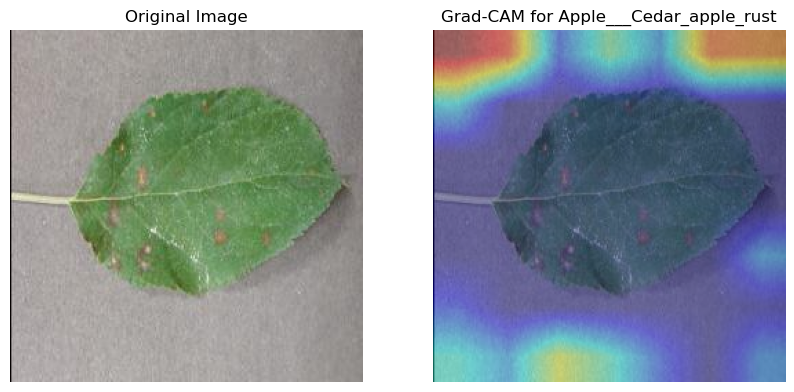

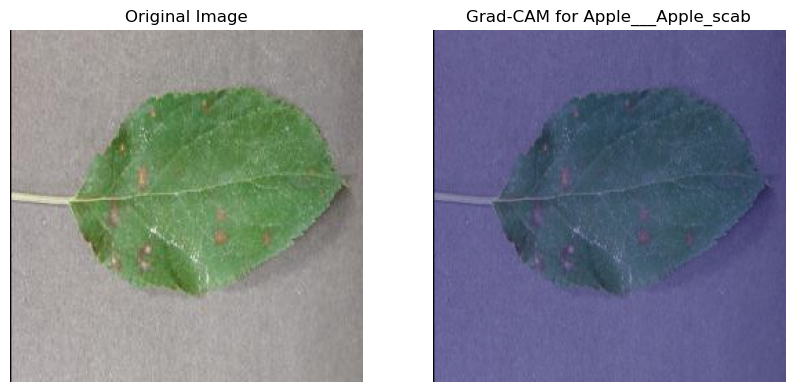

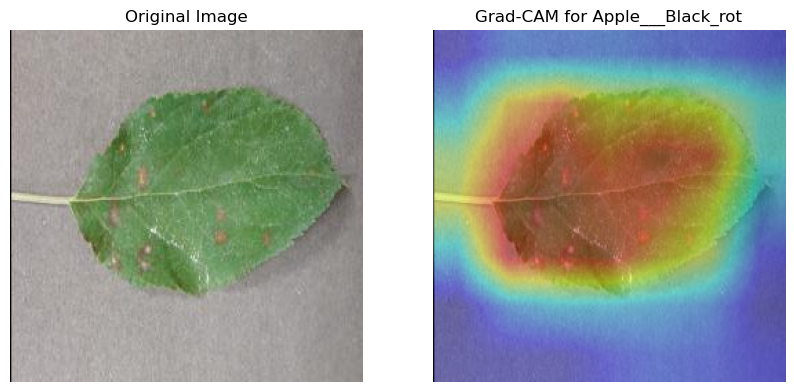

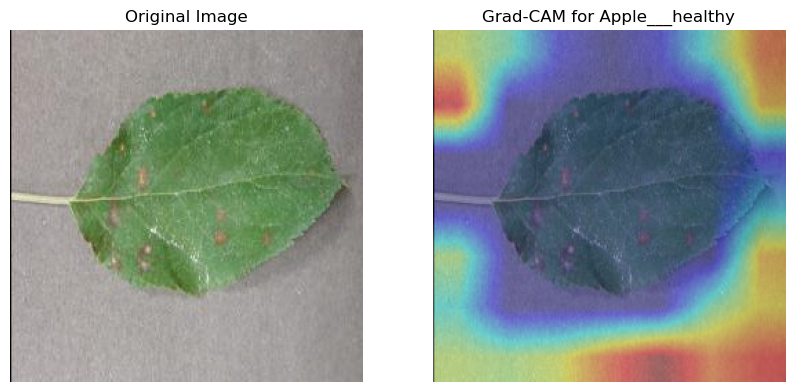

In [24]:
labels = [ 'Apple___Cedar_apple_rust', 'Apple___Apple_scab', 'Apple___Black_rot', 'Apple___healthy']

compute_gradcam(
    model=model,
    img_path='0a41c25a-f9a6-4c34-8e5c-7f89a6ac4c40___FREC_C.Rust 9807_270deg.JPG',
    image_dir='/Users/vinaypatel/Documents/plant/archive-2/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train2/Apple___Cedar_apple_rust',
    labels=labels,
    labels_to_show = [ 'Apple___Cedar_apple_rust', 'Apple___Apple_scab', 'Apple___Black_rot', 'Apple___healthy']

)


In [ ]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping


base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

s
x = base_model.output
x = GlobalAveragePooling2D()(x)  
predictions = Dense(4, activation="sigmoid")(x)  


pos_weights = [1.0, 1.0, 1.0, 1.0] 
neg_weights = [1.0, 1.0, 1.0, 1.0]  


efficientnet_model = Model(inputs=base_model.input, outputs=predictions)


efficientnet_model.compile(
    optimizer=Adam(learning_rate=1e-4), 
    loss=get_weighted_loss(pos_weights, neg_weights),  
    metrics=['accuracy']
)


checkpoint = ModelCheckpoint("best_model_efficientnet.keras", save_best_only=True, monitor="val_loss", mode="min")
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.2, patience=5, min_lr=1e-6)
early_stopping = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True)


history = efficientnet_model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=10,  
    callbacks=[checkpoint, reduce_lr, early_stopping]
)


/Users/vinaypatel/Documents/anoconda/anaconda3/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 268s 3s/step - accuracy: 0.6797 - loss: 0.4777 - val_accuracy: 0.2981 - val_loss: 0.6740 - learning_rate: 1.0000e-04
Epoch 2/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 229s 3s/step - accuracy: 0.9505 - loss: 0.0876 - val_accuracy: 0.2981 - val_loss: 0.6749 - learning_rate: 1.0000e-04
Epoch 3/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 206s 3s/step - accuracy: 0.9860 - loss: 0.0333 - val_accuracy: 0.2606 - val_loss: 0.6970 - learning_rate: 1.0000e-04
Epoch 4/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 224s 3s/step - accuracy: 0.9937 - loss: 0.0205 - val_accuracy: 0.2548 - val_loss: 0.7316 - learning_rate: 1.0000e-04
Epoch 5/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 214s 3s/step - accuracy: 0.9947 - loss: 0.0137 - val_accuracy: 0.3115 - val_loss: 0.7321 - learning_rate: 1.0000e-04
Epoch 6/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 226s 3s/step - accuracy: 0.9963 - loss: 0.0102 - val_accuracy: 0.4125 - val_loss: 0.6761 - learning_rate: 1.0000e-04
Epoch 7/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 210s 3s/step - accuracy: 0.9938 

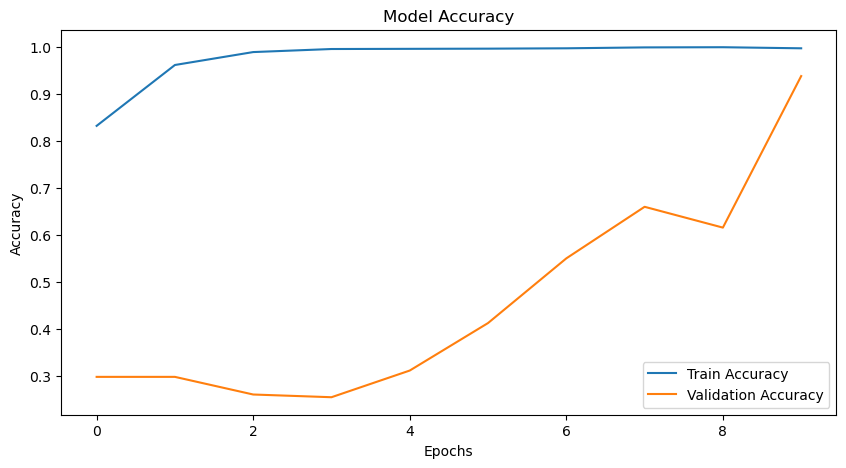

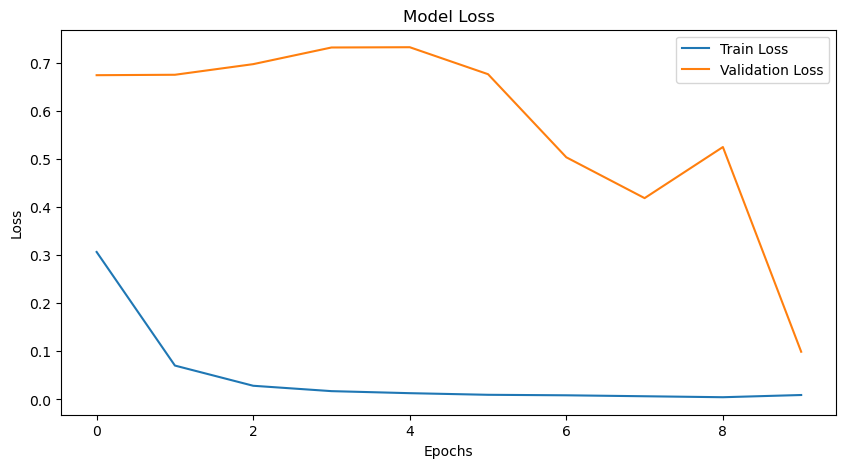

In [14]:
# Visualization: Plot Training History
plt.figure(figsize=(10, 5))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:

efficientnet_model.load_weights("best_model_efficientnet.keras")
loss, accuracy = efficientnet_model.evaluate(test_gen)  
print(f"Test Accuracy: {accuracy * 100:.2f}%")

/Users/vinaypatel/Documents/anoconda/anaconda3/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - accuracy: 0.4286 - loss: 4.1436
Test Accuracy: 42.86%


In [ ]:

efficientnet_model.load_weights("best_model_efficientnet.keras")
loss, accuracy = efficientnet_model.evaluate(train_gen)  
print(f"train Accuracy: {accuracy * 100:.2f}%")

82/82 ━━━━━━━━━━━━━━━━━━━━ 34s 416ms/step - accuracy: 0.9113 - loss: 0.1280
train Accuracy: 90.38%


In [ ]:
def compute_gradcam(model, img_path, image_dir, labels, labels_to_show):
   
    labels = [label for label in labels if label != '.DS_Store']
    labels_to_show = [label for label in labels_to_show if label in labels]

    
    img_full_path = os.path.join(image_dir, img_path)
    img = tf.keras.preprocessing.image.load_img(img_full_path, target_size=(224, 224))
    img_array = tf.keras.preprocessing.image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    
    preds = model.predict(img_array)
    print(f"Predictions for {img_path}:")
    for i, label in enumerate(labels):
        if i < preds.shape[1]:
            print(f"{label}: {preds[0][i]:.4f}")
        else:
            print(f"{label}: No prediction available (index out of bounds).")

    
    conv_layer_name = 'block7a_project_bn'  
    grad_model = Model(
        inputs=model.input,
        outputs=[model.get_layer(conv_layer_name).output, model.output]
    )

    
    for label in labels_to_show:
        label_index = labels.index(label)
        with tf.GradientTape() as tape:
            conv_outputs, predictions = grad_model(img_array)
            loss = predictions[:, label_index]

        grads = tape.gradient(loss, conv_outputs)
        pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
        conv_outputs = conv_outputs[0]

      
        heatmap = np.maximum(np.dot(conv_outputs, pooled_grads.numpy()), 0)
        heatmap /= np.max(heatmap) if np.max(heatmap) else 1

   
        original_img = cv2.imread(img_full_path)
        heatmap_resized = cv2.resize(heatmap, (original_img.shape[1], original_img.shape[0]))
        heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)
        overlay = cv2.addWeighted(original_img, 0.6, heatmap_colored, 0.4, 0)

  
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.title("Original Image")
        plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.title(f"Grad-CAM for {label}")
        plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
        plt.axis('off')

        plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Predictions for AppleCedarRust1.JPG:
Apple___Cedar_apple_rust: 0.0373
Apple___Apple_scab: 0.0141
Apple___Black_rot: 0.9543
Apple___healthy: 0.0553


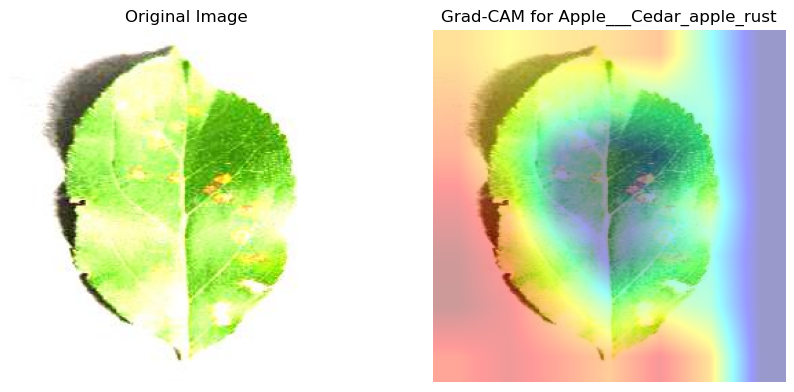

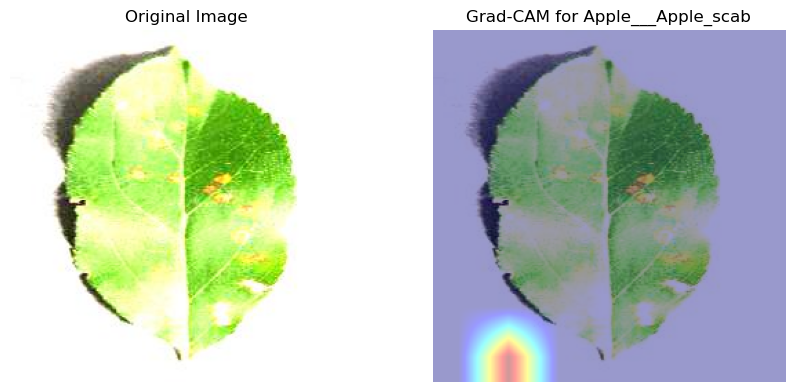

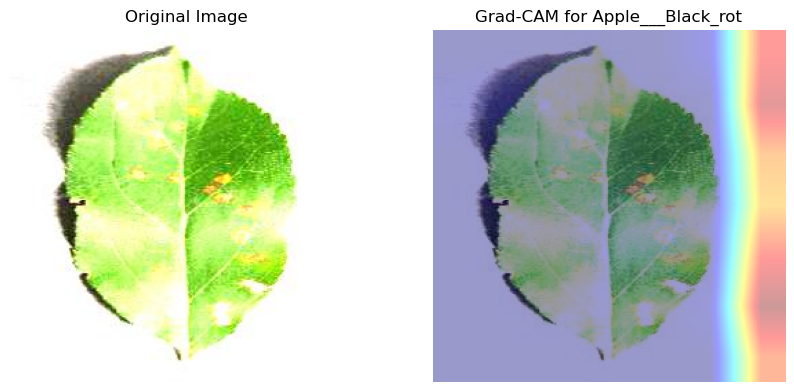

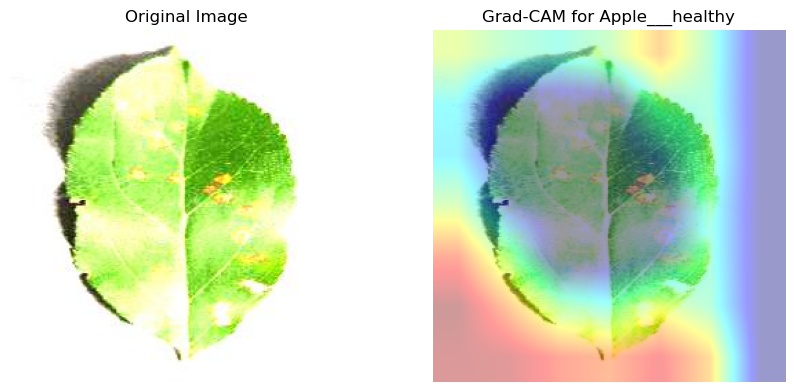

In [32]:
import cv2
labels = [ 'Apple___Cedar_apple_rust', 'Apple___Apple_scab', 'Apple___Black_rot', 'Apple___healthy']

compute_gradcam(
    model=efficientnet_model,
    img_path='AppleCedarRust1.JPG',
    image_dir='/Users/vinaypatel/Documents/plant/archive-2/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/test2/test',
    labels=labels,
    labels_to_show = [ 'Apple___Cedar_apple_rust', 'Apple___Apple_scab', 'Apple___Black_rot', 'Apple___healthy']

)
